In [2]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
#pip install graphviz

In [4]:
#pip install xgboost

In [5]:
#import datasets
df = pd.read_csv("churn.csv")

In [6]:
#step 1 EDA
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [7]:
type(df)

pandas.core.frame.DataFrame

In [8]:
df.dtypes

Unnamed: 0          int64
state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge         object
eve.mins           object
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [9]:
df.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,1443.520003,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,2500.500000,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,3750.250000,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,5000.000000,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [10]:
df.columns

Index(['Unnamed: 0', 'state', 'area.code', 'account.length', 'voice.plan',
       'voice.messages', 'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge',
       'day.mins', 'day.calls', 'day.charge', 'eve.mins', 'eve.calls',
       'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls', 'churn'],
      dtype='object')

In [11]:
df.shape

(5000, 21)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [13]:
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [14]:
df.tail()


,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no
4999,5000,VT,area_code_415,86,yes,34,no,9.3,16,2.51,...,102,22,267.1,104,22.70,154.8,100,6.97,0,no


In [15]:
df['day.charge']=pd.to_numeric(df['day.charge'],errors='coerce')

In [16]:
df['eve.mins']=pd.to_numeric(df['eve.mins'],errors='coerce')

In [17]:
df.isnull().sum()

Unnamed: 0         0
state              0
area.code          0
account.length     0
voice.plan         0
voice.messages     0
intl.plan          0
intl.mins          0
intl.calls         0
intl.charge        0
day.mins           0
day.calls          0
day.charge         7
eve.mins          24
eve.calls          0
eve.charge         0
night.mins         0
night.calls        0
night.charge       0
customer.calls     0
churn              0
dtype: int64

In [18]:
df.isnull().values.any()

True

In [19]:
df['day.charge'].mean()
df['day.charge'].fillna(value = df['day.charge'].mean(),inplace=True)

In [20]:
df['eve.mins'].mean()
df['eve.mins'].fillna(value = df['eve.mins'].mean(),inplace=True)

In [21]:
df.isna().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [22]:
#Dropping the Unnamed column.

df.drop('Unnamed: 0', axis=1, inplace=True)
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,yes,40,no,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,no
4996,WV,area_code_415,152,no,0,no,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,DC,area_code_415,61,no,0,no,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,no
4998,DC,area_code_510,109,no,0,no,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,no


In [23]:
df[df.duplicated()]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn


In [24]:
df.shape

(5000, 20)

In [25]:
df.drop_duplicates(inplace=True)

In [26]:
df.reset_index(drop=True, inplace=True)

In [27]:
df['churn'].unique()

array(['no', 'yes'], dtype=object)

In [28]:
df['churn'].value_counts()

no     4293
yes     707
Name: churn, dtype: int64

In [29]:
df['voice.plan'] = df['voice.plan'].astype('category')
df['intl.plan'] = df['intl.plan'].astype('category')
df['churn'] = df['churn'].astype('category')
df.dtypes

state               object
area.code           object
account.length       int64
voice.plan        category
voice.messages       int64
intl.plan         category
intl.mins          float64
intl.calls           int64
intl.charge        float64
day.mins           float64
day.calls            int64
day.charge         float64
eve.mins           float64
eve.calls            int64
eve.charge         float64
night.mins         float64
night.calls          int64
night.charge       float64
customer.calls       int64
churn             category
dtype: object

In [30]:

# renaming the columns
df.columns
d1 = { 'area.code': 'Area_Code',
    'account.length': 'Account_length',
    'voice.plan': 'Voice_plan',
    'voice.messages': 'Voice_messages',
    'intl.plan': 'International_plan',
    'intl.mins': 'International_minutes',
    'intl.calls': 'International_calls',
    'intl.charge': 'International_charge',
    'day.mins': 'Day_mins',
    'day.calls': 'Day_calls',
    'day.charge': 'Day_Charge',
    'eve.mins': 'Evening_minutes',
    'eve.calls': 'Evening_Calls',
    'eve.charge': 'Evening_charge',
    'night.mins': 'Night_min',
    'night.calls': 'Night_calls',
    'night.charge': 'Night_charge',
    'customer.calls': 'Customer_calls'
      }

df.rename(columns = d1, inplace=True)
df.columns

Index(['state', 'Area_Code', 'Account_length', 'Voice_plan', 'Voice_messages',
       'International_plan', 'International_minutes', 'International_calls',
       'International_charge', 'Day_mins', 'Day_calls', 'Day_Charge',
       'Evening_minutes', 'Evening_Calls', 'Evening_charge', 'Night_min',
       'Night_calls', 'Night_charge', 'Customer_calls', 'churn'],
      dtype='object')

In [31]:
df.corr()


,Account_length,Voice_messages,International_minutes,International_calls,International_charge,Day_mins,Day_calls,Day_Charge,Evening_minutes,Evening_Calls,Evening_charge,Night_min,Night_calls,Night_charge,Customer_calls
Account_length,1.000000,-0.014575,0.001291,0.014277,0.001292,-0.001017,0.028240,-0.000799,-0.008688,0.009143,-0.009587,0.000668,-0.007825,0.000656,-0.001445
Voice_messages,-0.014575,1.000000,0.002463,0.000124,0.002505,0.005381,0.000883,0.005138,0.018862,-0.003954,0.019496,0.005541,0.002676,0.005535,-0.007086
International_minutes,0.001291,0.002463,1.000000,0.016791,0.999993,-0.019486,0.013097,-0.019281,-0.000346,-0.007458,0.000132,-0.006721,0.000391,-0.006717,-0.012122
International_calls,0.014277,0.000124,0.016791,1.000000,0.016900,-0.001303,0.010893,-0.001599,0.007987,0.005574,0.008393,-0.017214,-0.000156,-0.017182,-0.019147
International_charge,0.001292,0.002505,0.999993,0.016900,1.000000,-0.019415,0.013161,-0.019211,-0.000323,-0.007507,0.000155,-0.006655,0.000368,-0.006650,-0.012180
Day_mins,-0.001017,0.005381,-0.019486,-0.001303,-0.019415,1.000000,0.001935,0.999767,-0.010907,0.008128,-0.010760,0.011799,0.004236,0.011783,0.002733
Day_calls,0.028240,0.000883,0.013097,0.010893,0.013161,0.001935,1.000000,0.001665,-0.001724,0.003754,-0.000695,0.002804,-0.008308,0.002802,-0.010739
Day_Charge,-0.000799,0.005138,-0.019281,-0.001599,-0.019211,0.999767,0.001665,1.000000,-0.011534,0.007982,-0.011386,0.011315,0.004206,0.011299,0.002929
Evening_minutes,-0.008688,0.018862,-0.000346,0.007987,-0.000323,-0.010907,-0.001724,-0.011534,1.000000,0.003110,0.997662,-0.016501,0.015590,-0.016503,-0.012394
Evening_Calls,0.009143,-0.003954,-0.007458,0.005574,-0.007507,0.008128,0.003754,0.007982,0.003110,1.000000,0.002778,0.001781,-0.013682,0.001799,0.006235


In [32]:
df1 = df.select_dtypes(include='number')
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Account_length         5000 non-null   int64  
 1   Voice_messages         5000 non-null   int64  
 2   International_minutes  5000 non-null   float64
 3   International_calls    5000 non-null   int64  
 4   International_charge   5000 non-null   float64
 5   Day_mins               5000 non-null   float64
 6   Day_calls              5000 non-null   int64  
 7   Day_Charge             5000 non-null   float64
 8   Evening_minutes        5000 non-null   float64
 9   Evening_Calls          5000 non-null   int64  
 10  Evening_charge         5000 non-null   float64
 11  Night_min              5000 non-null   float64
 12  Night_calls            5000 non-null   int64  
 13  Night_charge           5000 non-null   float64
 14  Customer_calls         5000 non-null   int64  
dtypes: f

# data visualization

<AxesSubplot:>

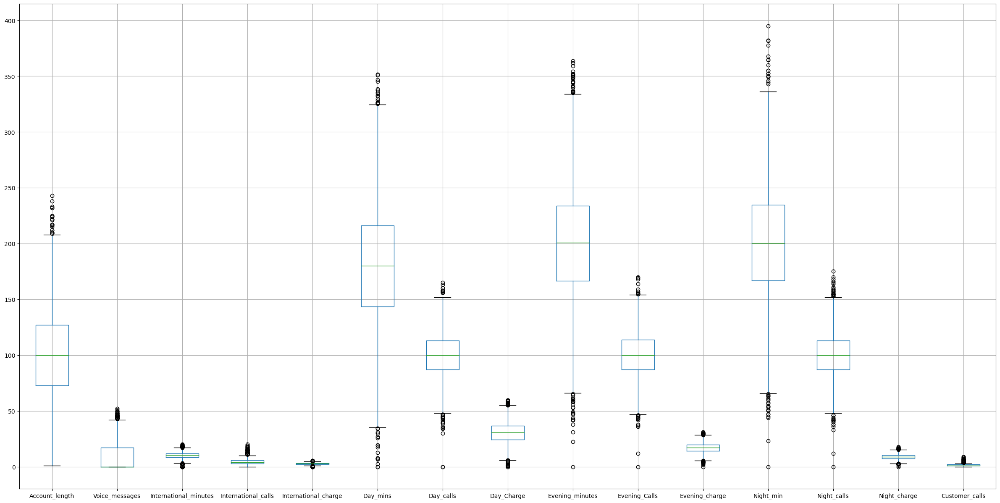

In [33]:
# Checking for the presence of outliers in numeric cols 

plt.figure(figsize=(30,15))
df.boxplot(column=['Account_length','Voice_messages','International_minutes','International_calls','International_charge','Day_mins','Day_calls','Day_Charge','Evening_minutes','Evening_Calls','Evening_charge','Night_min','Night_calls','Night_charge','Customer_calls'])

In [34]:
def detect_outliers_iqr(data):
    outlier_list = []
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    #print("The Val of Q1 and Q2",q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    #print("The lower & Upper Bound",lwr_bound, upr_bound)
    
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            outlier_list.append(i)
    return outlier_list

In [35]:
for i in ['Account_length','Voice_messages','International_minutes','International_calls','International_charge','Day_mins','Day_calls','Day_Charge','Evening_minutes','Evening_Calls','Evening_charge','Night_min','Night_calls','Night_charge','Customer_calls']:
    outliers = detect_outliers_iqr(df[i])
    print("Outliers in",i,"attribute :", outliers)
    

Outliers in Account_length attribute : [209, 209, 209, 210, 210, 212, 212, 215, 216, 217, 217, 217, 221, 222, 222, 224, 224, 225, 225, 232, 232, 233, 238, 243]
Outliers in Voice_messages attribute : [43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 43, 44, 44, 44, 44, 44, 44, 44, 44, 44, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 46, 46, 46, 46, 46, 46, 46, 46, 47, 47, 47, 47, 48, 48, 48, 48, 48, 49, 49, 49, 50, 50, 51, 52]
Outliers in International_minutes attribute : [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4, 1.1, 1.1, 1.3, 2.0, 2.0, 2.0, 2.1, 2.1, 2.2, 2.2, 2.4, 2.5, 2.6, 2.7, 2.9, 2.9, 3.1, 3.1, 17.3, 17.3, 17.3, 17.5, 17.5, 17.5, 17.6, 17.6, 17.7, 17.8, 17.8, 17.8, 17.9, 18.0, 18.0, 18.0, 18.2, 18.2, 18.3, 18.4, 18.5, 18.7, 18.9, 18.9, 19.2, 19.3, 19.7, 19.7, 20.0]
Outliers in International_calls attribute : [11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,

<AxesSubplot:>

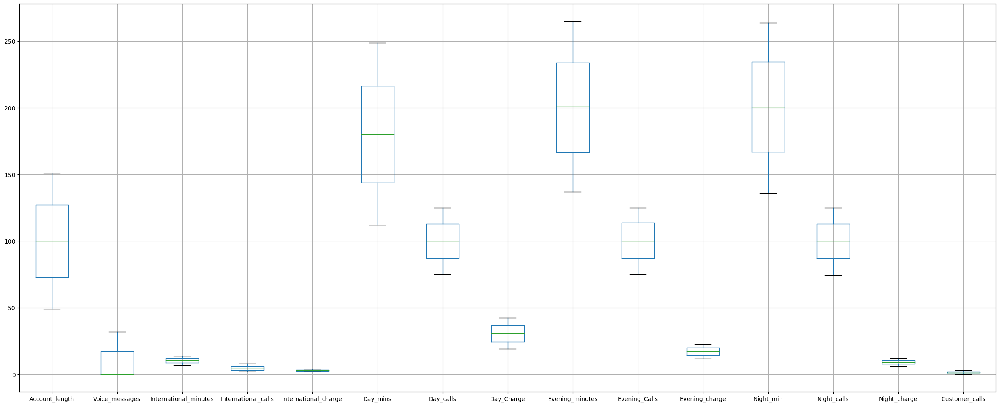

In [36]:
def handle_outliers(data):

    tenth_percentile = np.percentile(data, 10)
    ninetieth_percentile = np.percentile(data, 90)

    b = np.where(data<tenth_percentile, tenth_percentile, data)

    b1 = np.where(b>ninetieth_percentile, ninetieth_percentile, b)
    return b1
    
    
for i in ['Account_length','Voice_messages','International_minutes','International_calls','International_charge','Day_mins','Day_calls','Day_Charge','Evening_minutes','Evening_Calls','Evening_charge','Night_min','Night_calls','Night_charge','Customer_calls']:
    df[i]=handle_outliers(df[i])

    
plt.figure(figsize=(30,12))
df.boxplot(column=['Account_length','Voice_messages','International_minutes','International_calls','International_charge','Day_mins','Day_calls','Day_Charge','Evening_minutes','Evening_Calls','Evening_charge','Night_min','Night_calls','Night_charge','Customer_calls']) 



In [37]:
df['churn'].unique()


['no', 'yes']
Categories (2, object): ['no', 'yes']

In [38]:
df['churn'].value_counts()

no     4293
yes     707
Name: churn, dtype: int64

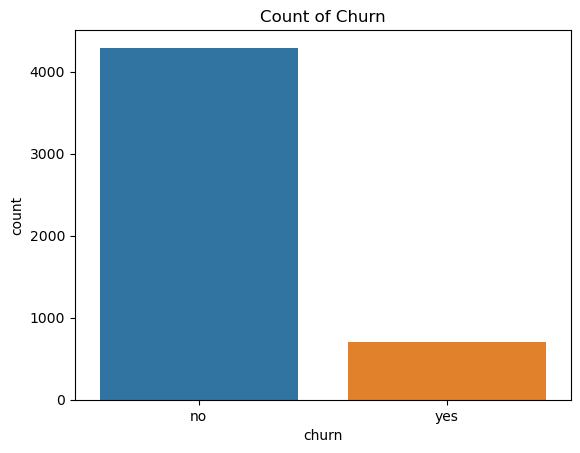

In [39]:
# plotting with target feature
sns.countplot(data=df, x='churn')
plt.title('Count of Churn')
plt.show()

<AxesSubplot:ylabel='churn'>

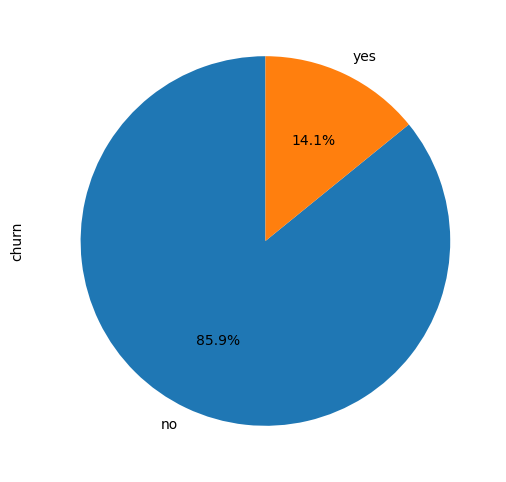

In [40]:
s=df['churn'].value_counts()
plt.figure(figsize=(6, 6))
s.plot(kind='pie', autopct='%1.1f%%', startangle=90)

Text(0.5, 1.0, 'Correlation map')

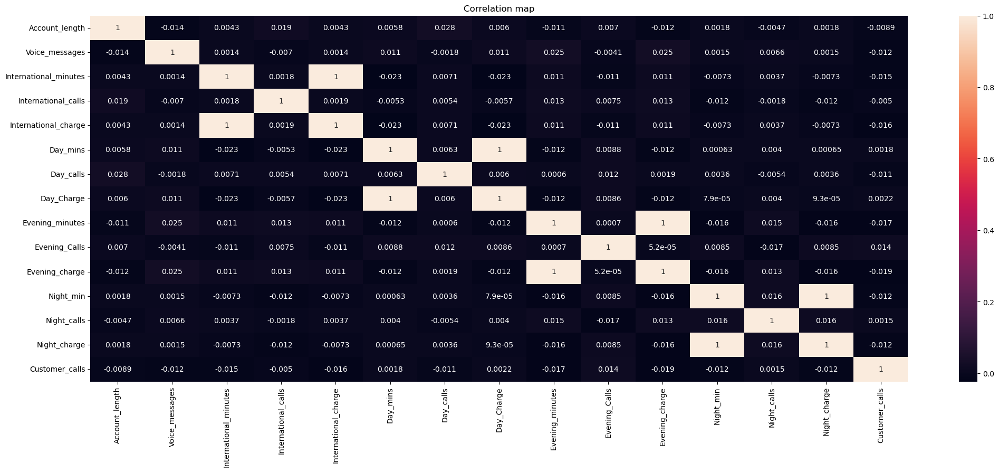

In [41]:
plt.figure(figsize=(25,9));
sns.heatmap(df.corr(),annot=True);
plt.title("Correlation map")

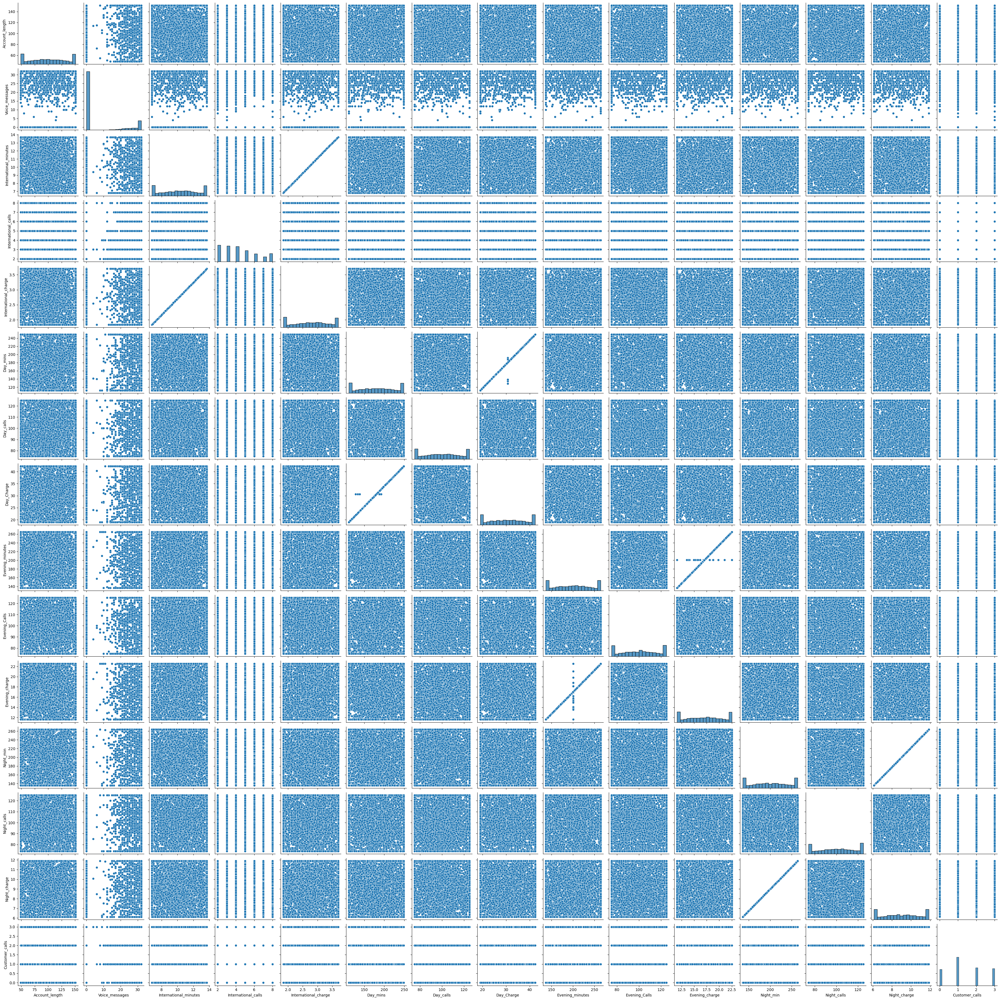

In [42]:
# pairplot for numeric columns
sns.pairplot(df)

<AxesSubplot:xlabel='International_plan', ylabel='count'>

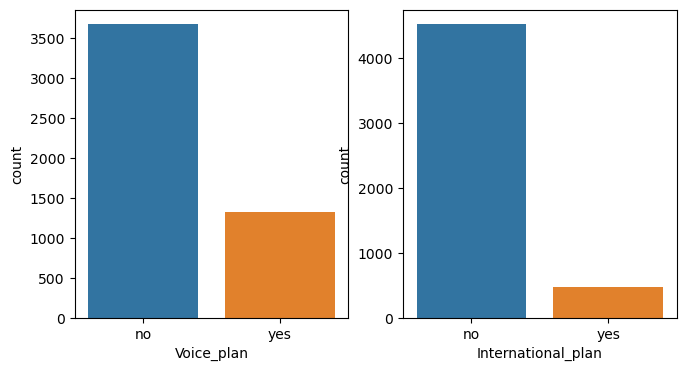

In [43]:
plt.figure(figsize=(12, 4)) 
plt.subplot(1,3,1)
sns.countplot(x=df['Voice_plan'])
plt.subplot(1,3,2)
sns.countplot(x=df['International_plan'])

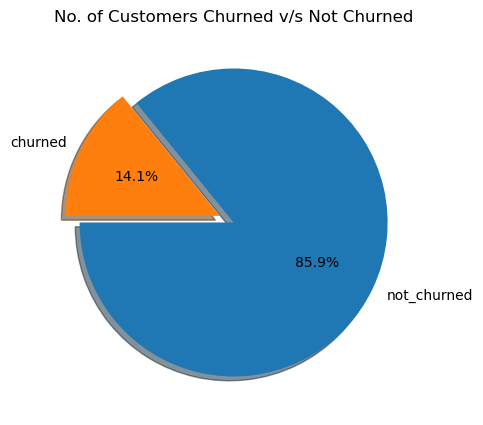

In [44]:
# Checking the Imbalance in Data
not_churned = df[df['churn']=='no']['churn'].count()
churned = df[df['churn']=='yes']['churn'].count()

fig = plt.figure(figsize=(5,5)) 
plt.pie([not_churned,churned], labels=['not_churned','churned'],explode=(0,0.1),\
        shadow=True, autopct="%1.1f%%", startangle=180)
plt.title('No. of Customers Churned v/s Not Churned')
plt.show()


<AxesSubplot:xlabel='state', ylabel='count'>

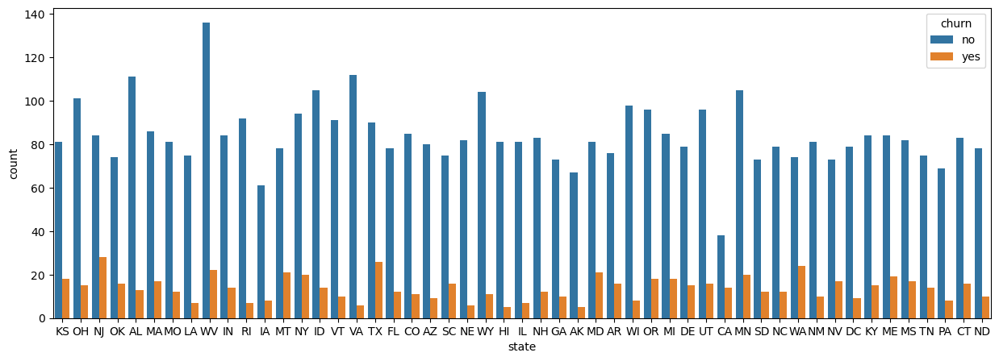

In [45]:
fig = plt.figure(figsize=(15,5)) 
sns.countplot(data=df, x='state', hue='churn')


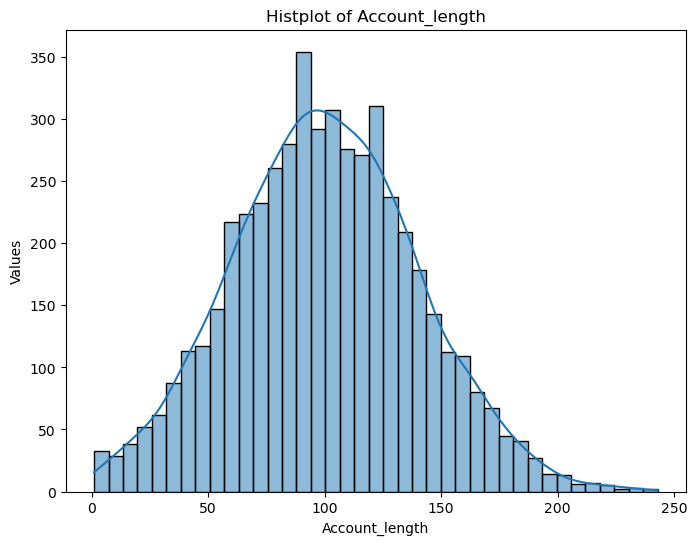

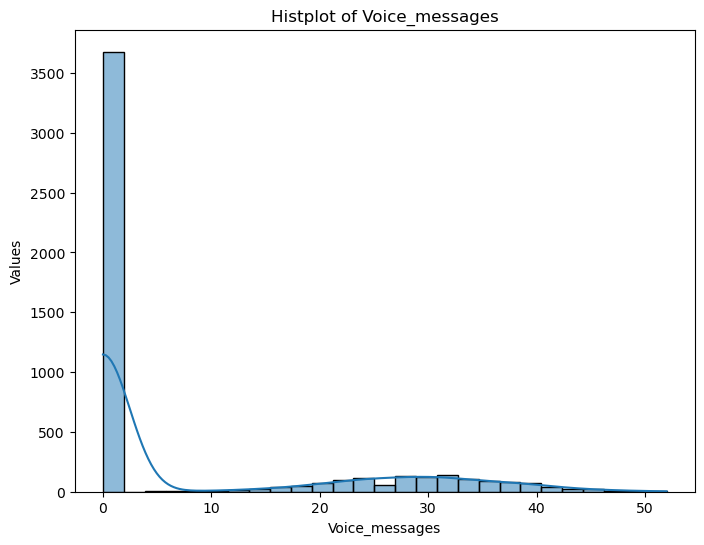

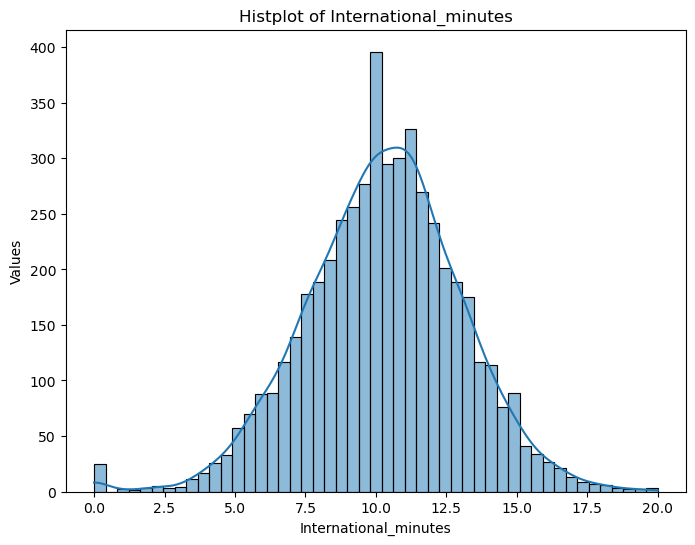

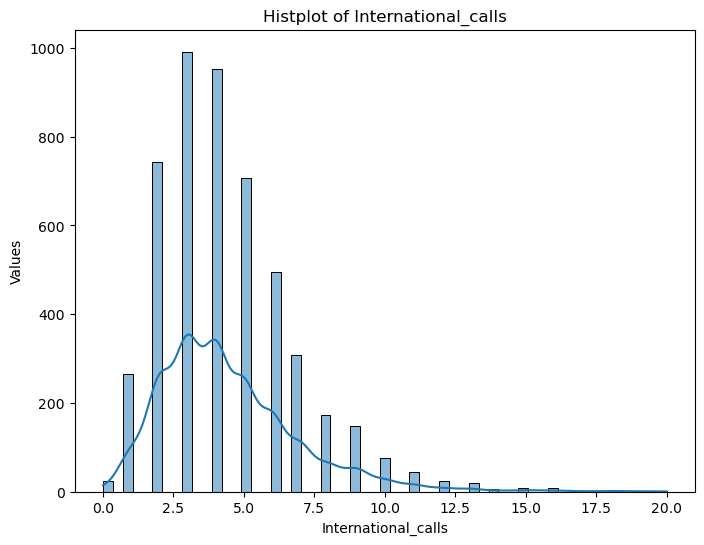

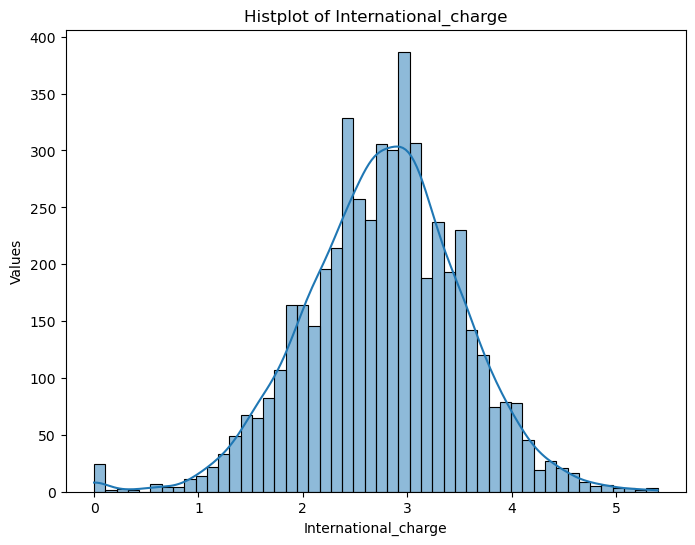

...

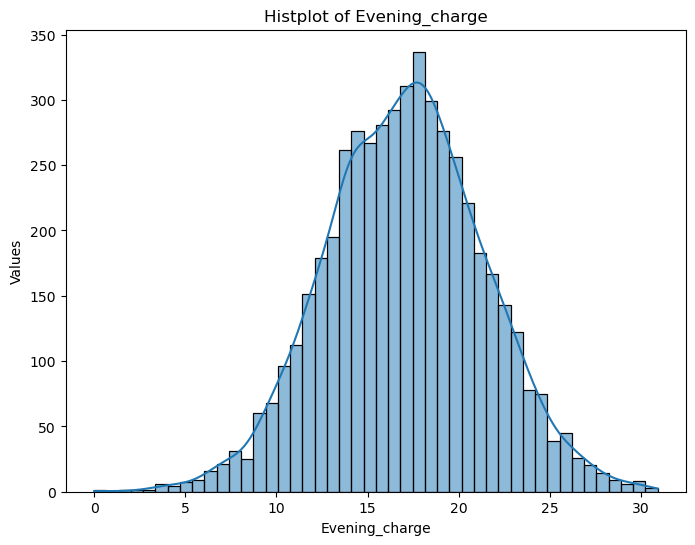

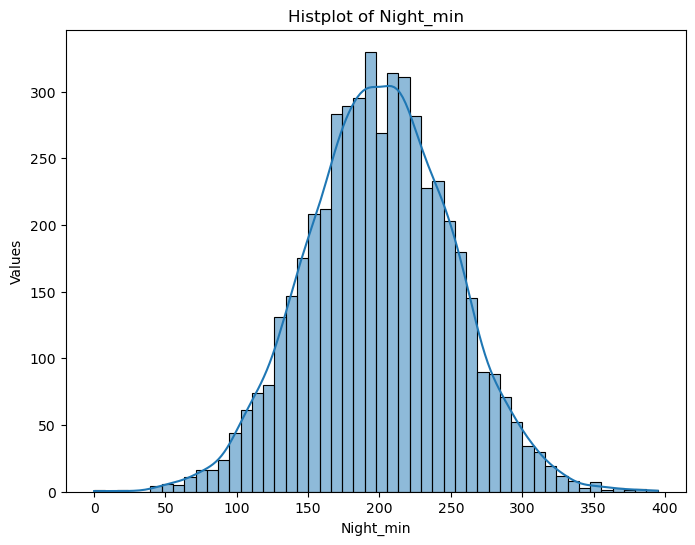

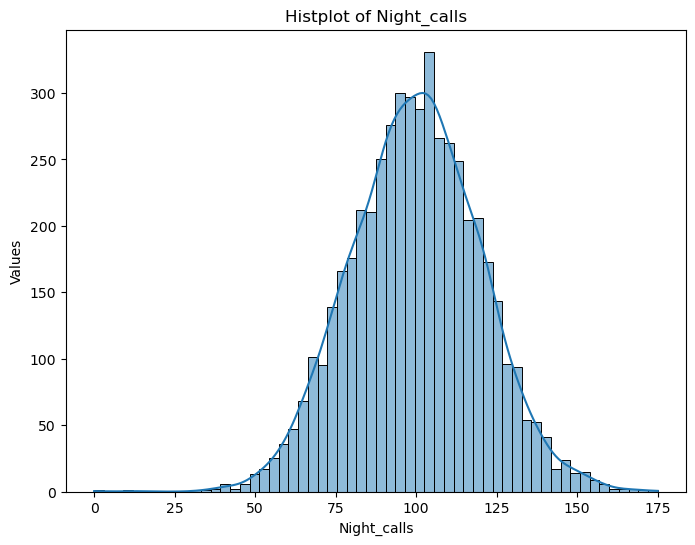

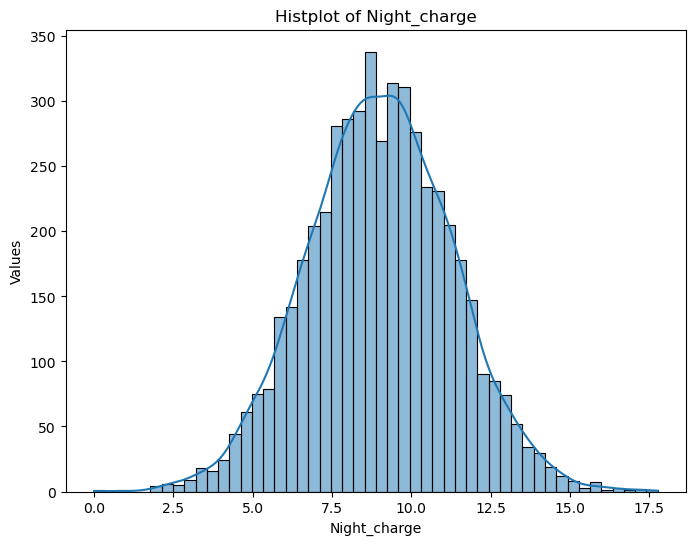

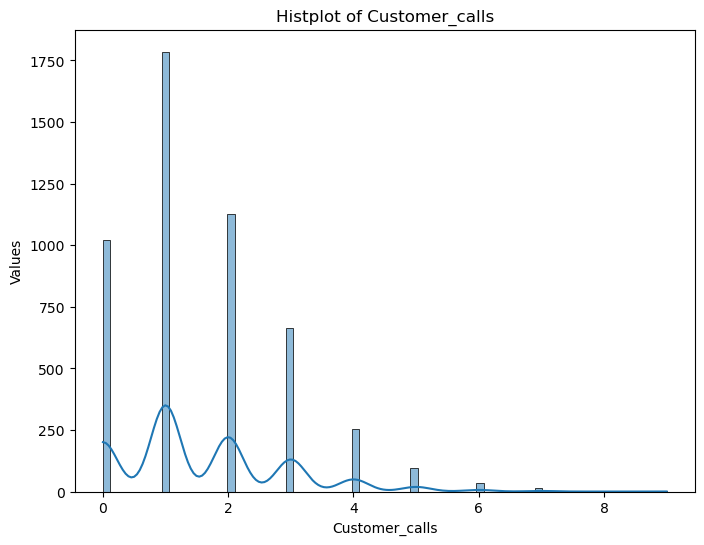

In [46]:
for column in df1:
    plt.figure(figsize=(8, 6))
    sns.histplot(x=df1[column], kde=True)
    plt.title(f'Histplot of {column}')
    plt.xlabel(column)
    plt.ylabel('Values')
    plt.show()

In [47]:
#skewness check
df.skew()

Account_length           0.006324
Voice_messages           1.210393
International_minutes   -0.044942
International_calls      0.535142
International_charge    -0.042171
Day_mins                 0.003155
Day_calls               -0.017646
Day_Charge               0.002320
Evening_minutes          0.005895
Evening_Calls           -0.012979
Evening_charge           0.011360
Night_min               -0.010916
Night_calls             -0.033932
Night_charge            -0.008907
Customer_calls           0.164731
dtype: float64

## Features Engineering

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   state                  5000 non-null   object  
 1   Area_Code              5000 non-null   object  
 2   Account_length         5000 non-null   float64 
 3   Voice_plan             5000 non-null   category
 4   Voice_messages         5000 non-null   float64 
 5   International_plan     5000 non-null   category
 6   International_minutes  5000 non-null   float64 
 7   International_calls    5000 non-null   float64 
 8   International_charge   5000 non-null   float64 
 9   Day_mins               5000 non-null   float64 
 10  Day_calls              5000 non-null   float64 
 11  Day_Charge             5000 non-null   float64 
 12  Evening_minutes        5000 non-null   float64 
 13  Evening_Calls          5000 non-null   float64 
 14  Evening_charge         5000 non-null   f

In [49]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

for i in range(0,20):
    df.iloc[:,i] = LE.fit_transform(df.iloc[:,i])

In [50]:
# split the variables
X = df.drop(columns= ['churn'])
Y = df['churn']

In [51]:
Y.value_counts()

0    4293
1     707
Name: churn, dtype: int64

In [52]:
# Data partition
from sklearn.model_selection import train_test_split 
X_train, X_test, Y_train, Y_test = train_test_split(X, Y , test_size=.30, stratify= Y, random_state=42) 
Y_train.value_counts(), Y_test.value_counts()

(0    3005
 1     495
 Name: churn, dtype: int64,
 0    1288
 1     212
 Name: churn, dtype: int64)

# Hypothesis testing between categorical columns
1. Ho: There is no association between the two categories
2. Ha: There is association between the two categories
If p<0.05, we reject the null hypothesis
If p> 0.05, we fail to reject the null hypothesis

In [53]:
import researchpy as rp
table, results = rp.crosstab(df['state'], df['Area_Code'], test= 'chi-square')

In [54]:
table
results

,Chi-square test,results
0,Pearson Chi-square ( 100.0) =,103.9286
1,p-value =,0.3740
2,Cramer's V =,0.1019


In [55]:
import scipy.stats as stats
tabvalue = stats.chi2.ppf(q = 0.95, df = 8)
tabvalue.round(4)

15.5073

In [56]:
pvalue = 0.0395
alpha = 0.05

if pvalue < alpha:
    print("Ho is rejected and H1 is accepted")
else:
    print("H1 is rejected and H0 is accepted")

Ho is rejected and H1 is accepted


In [57]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
# find best scored 5 features
select_feature = SelectKBest(chi2, k=5).fit(X_train, Y_train)

In [58]:
print('Score list:', select_feature.scores_)
print('Feature list:', X_train.columns)
print('Score list:', select_feature)

Score list: [5.48605650e+00 4.26006355e-02 8.74697565e+01 3.57788446e+01
 6.91730820e+02 2.18789716e+02 2.23839573e+02 2.11565081e+01
 2.23839573e+02 2.65147525e+04 4.06748843e+01 2.64871412e+04
 5.26025153e+03 2.93878605e-01 4.63948656e+03 1.45022250e+03
 1.88097854e-01 6.97907161e+02 4.06087867e+01]
Feature list: Index(['state', 'Area_Code', 'Account_length', 'Voice_plan', 'Voice_messages',
       'International_plan', 'International_minutes', 'International_calls',
       'International_charge', 'Day_mins', 'Day_calls', 'Day_Charge',
       'Evening_minutes', 'Evening_Calls', 'Evening_charge', 'Night_min',
       'Night_calls', 'Night_charge', 'Customer_calls'],
      dtype='object')
Score list: SelectKBest(k=5, score_func=<function chi2 at 0x0000027802B24310>)


In [59]:
chi_test = pd.DataFrame(select_feature.scores_).T
chi_test.columns = X_train.columns

In [60]:
chi_test

,state,Area_Code,Account_length,Voice_plan,Voice_messages,International_plan,International_minutes,International_calls,International_charge,Day_mins,Day_calls,Day_Charge,Evening_minutes,Evening_Calls,Evening_charge,Night_min,Night_calls,Night_charge,Customer_calls
0,5.486056,0.042601,87.469757,35.778845,691.73082,218.789716,223.839573,21.156508,223.839573,26514.752469,40.674884,26487.141151,5260.251532,0.293879,4639.486557,1450.222501,0.188098,697.907161,40.608787


In [61]:
from sklearn.feature_selection import RFECV

# The "accuracy" scoring is proportional to the number of correct classifications
clf_rf_4 = RandomForestClassifier() 
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='accuracy')   #5-fold cross-validation
rfecv = rfecv.fit(X_train, Y_train)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X_train.columns[rfecv.support_])

<IPython.core.display.Javascript object>

Optimal number of features : 18
Best features : Index(['state', 'Account_length', 'Voice_plan', 'Voice_messages',
       'International_plan', 'International_minutes', 'International_calls',
       'International_charge', 'Day_mins', 'Day_calls', 'Day_Charge',
       'Evening_minutes', 'Evening_Calls', 'Evening_charge', 'Night_min',
       'Night_calls', 'Night_charge', 'Customer_calls'],
      dtype='object')


Accuracy is:  0.9153333333333333


<AxesSubplot:>

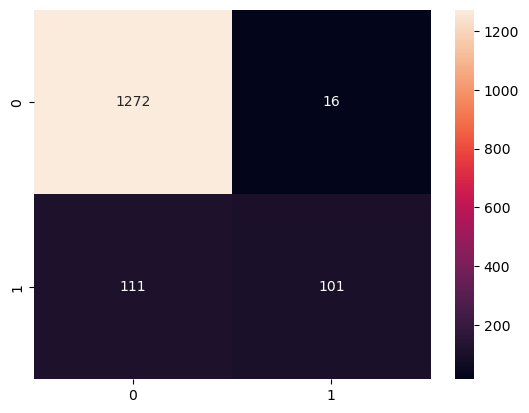

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.metrics import accuracy_score


#random forest classifier with n_estimators=10 (default)
clf_rf = RandomForestClassifier(random_state=45)      
clr_rf = clf_rf.fit(X_train,Y_train)

ac = accuracy_score(Y_test,clf_rf.predict(X_test))
print('Accuracy is: ',ac)
cm = confusion_matrix(Y_test,clf_rf.predict(X_test))
sns.heatmap(cm,annot=True,fmt="d")

Feature ranking:
1. feature 11 (0.129848)
2. feature 9 (0.104223)
3. feature 5 (0.078701)
4. feature 12 (0.066448)
5. feature 14 (0.065991)
6. feature 7 (0.054115)
7. feature 8 (0.051584)
8. feature 17 (0.048563)
9. feature 15 (0.048190)
10. feature 6 (0.046367)
11. feature 18 (0.041852)
12. feature 0 (0.041469)
13. feature 2 (0.040442)
14. feature 16 (0.039550)
15. feature 10 (0.039527)
16. feature 13 (0.036523)
17. feature 4 (0.030028)
18. feature 3 (0.023460)
19. feature 1 (0.013117)


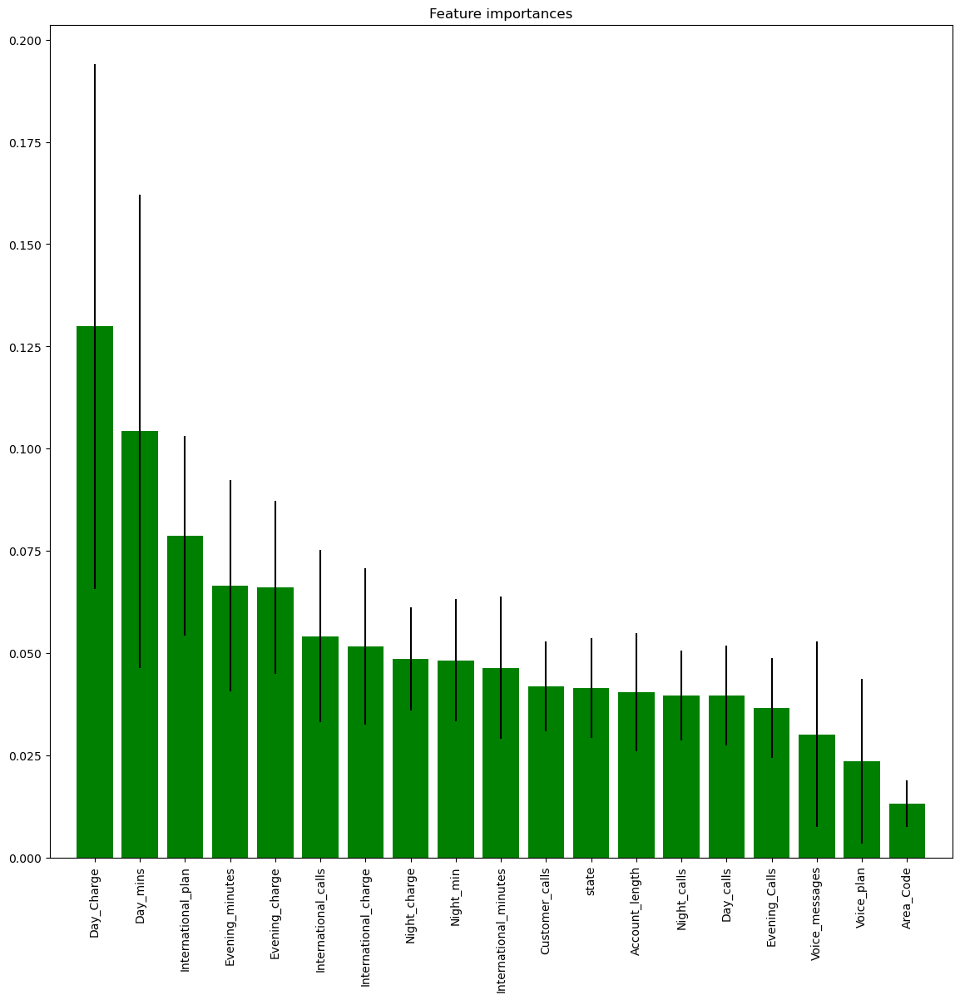

In [63]:
clf_rf_5 = RandomForestClassifier()      
clr_rf_5 = clf_rf_5.fit(X_train,Y_train)
importances = clr_rf_5.feature_importances_
std = np.std([tree.feature_importances_ for tree in clf_rf.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest

plt.figure(1, figsize=(14, 13))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), X_train.columns[indices],rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [64]:
df.drop(columns= ['Voice_plan', 'Area_Code','state'], inplace= True)

In [65]:
df.head()

,Account_length,Voice_messages,International_plan,International_minutes,International_calls,International_charge,Day_mins,Day_calls,Day_Charge,Evening_minutes,Evening_Calls,Evening_charge,Night_min,Night_calls,Night_charge,Customer_calls,churn
0,79,20,0,32,1,32,1270,35,1271,569,24,490,1027,17,487,1,0
1,58,21,0,69,1,69,457,48,457,550,28,474,1117,29,531,1,0
2,88,0,0,54,3,54,1227,39,1228,0,35,0,234,30,118,0,0
3,35,0,1,0,5,0,1270,0,1271,0,13,0,569,15,272,2,0
4,26,0,1,33,1,33,504,38,504,101,47,88,470,47,227,3,0


In [66]:
# split the variables
X = df.drop(columns= ['churn'])
Y = df['churn']

In [67]:
# Data transformation
from sklearn.preprocessing import StandardScaler
SS = StandardScaler()
SS_X  = SS.fit_transform(X)
SS_X = pd.DataFrame(SS_X)
SS_X
list(X)
SS_X.columns = list(X)
SS_X

,Account_length,Voice_messages,International_plan,International_minutes,International_calls,International_charge,Day_mins,Day_calls,Day_Charge,Evening_minutes,Evening_Calls,Evening_charge,Night_min,Night_calls,Night_charge,Customer_calls
0,0.849949,1.375642,-0.323240,-0.131076,-0.692499,-0.131076,1.539129,0.613519,1.538773,-0.085837,-0.072200,-0.085905,1.086500,-0.537189,1.075382,-0.429166
1,0.212018,1.473270,-0.323240,1.550550,-0.692499,1.550550,-0.428883,1.420110,-0.430327,-0.133977,0.175526,-0.133021,1.316139,0.193581,1.312659,-0.429166
2,1.123348,-0.576925,-0.323240,0.868810,0.353572,0.868810,1.435040,0.861701,1.434755,-1.527495,0.609047,-1.528841,-0.936874,0.254478,-0.914506,-1.390559
3,-0.486669,-0.576925,3.093675,-1.585455,1.399643,-1.585455,1.539129,-1.558075,1.538773,-1.527495,-0.753446,-1.528841,-0.082107,-0.658984,-0.084038,0.532227
4,-0.760068,-0.576925,3.093675,-0.085627,-0.692499,-0.085627,-0.315111,0.799655,-0.316632,-1.271594,1.352225,-1.269701,-0.334709,1.289735,-0.326707,1.493620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-1.519509,2.059040,-0.323240,-0.176525,0.353572,-0.176525,1.265592,1.544201,1.265422,0.555181,1.538019,0.550165,1.525366,0.985248,1.544543,0.532227
4996,1.579013,-0.576925,-0.323240,1.550550,-1.215534,1.550550,0.098825,-0.627392,0.099443,1.365955,-1.558556,1.359976,0.333795,0.802555,0.320411,1.493620
4997,-1.185355,-0.576925,-0.323240,1.505101,-0.169463,1.505101,-0.920280,-0.689437,-0.921392,-0.688850,1.538019,-0.680748,0.303176,-0.171804,0.293448,-0.429166
4998,0.272773,-0.576925,-0.323240,-0.812816,0.876607,-0.812816,0.193232,-1.558075,0.193786,-0.716721,-0.505720,-0.710196,0.601707,-0.658984,0.584651,-1.390559


In [68]:
# Data partition
from sklearn.model_selection import train_test_split 
X_train, X_test, Y_train, Y_test = train_test_split(SS_X, Y , test_size=.30, stratify= Y, random_state=42) 
Y_train.value_counts(), Y_test.value_counts()


(0    3005
 1     495
 Name: churn, dtype: int64,
 0    1288
 1     212
 Name: churn, dtype: int64)

In [69]:
# training samples
X_train.shape,Y_train.shape

((3500, 16), (3500,))

In [70]:
# test samples
X_test.shape,Y_test.shape

((1500, 16), (1500,))

In [71]:
# Model fitting

# logistic regression With K best

In [72]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train,Y_train) # fitting the model
# predictions
Y_pred_train = logreg.predict(X_train)
Y_pred_test  = logreg.predict(X_test)


In [73]:
#Metrics
from sklearn.metrics import accuracy_score
print('Training Accuracy score: ' ,accuracy_score(Y_train,Y_pred_train).round(3))
print('Test Accuracy score: ' ,accuracy_score(Y_test,Y_pred_test).round(3))


Training Accuracy score:  0.863
Test Accuracy score:  0.873


In [74]:
from sklearn.metrics import classification_report
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      3005
           1       0.57      0.14      0.22       495

    accuracy                           0.86      3500
   macro avg       0.72      0.56      0.57      3500
weighted avg       0.83      0.86      0.83      3500



In [75]:

Traning_accuracy = []
Test_accuracy = []

for i in range(0,1000):
    X_train,X_test,Y_train,Y_test = train_test_split(X,Y,stratify= Y, test_size = 0.30,random_state=i)
    logreg.fit(X_train,Y_train)
    Y_pred_train = logreg.predict(X_train)
    Y_pred_test  = logreg.predict(X_test)
    Traning_accuracy.append(accuracy_score(Y_train,Y_pred_train).round(2))
    Test_accuracy.append(accuracy_score(Y_test,Y_pred_test).round(2))

import numpy as np    
print('Average Training Accuracy',np.mean(Traning_accuracy).round(2))
print('Average Test Accuracy',np.mean(Test_accuracy).round(2))


Average Training Accuracy 0.86
Average Test Accuracy 0.86


# knn classifier

In [76]:
from sklearn.neighbors import KNeighborsClassifier
training_acc = []
test_acc = []

for i in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,Y_train)
    Y_pred_train = knn.predict(X_train)
    Y_pred_test  = knn.predict(X_test)
    training_acc.append(accuracy_score(Y_train,Y_pred_train).round(2))
    test_acc.append(accuracy_score(Y_test,Y_pred_test).round(2))
    
print(training_acc)
print(test_acc)

[1.0, 0.9, 0.9, 0.89, 0.89, 0.89, 0.89, 0.88, 0.88, 0.88, 0.89, 0.88, 0.88, 0.88]
[0.79, 0.86, 0.84, 0.86, 0.86, 0.87, 0.87, 0.88, 0.87, 0.88, 0.88, 0.88, 0.87, 0.88]


In [77]:
d1= pd.DataFrame(range(1,15))
d2= pd.DataFrame(training_acc)
d3= pd.DataFrame(test_acc)
pd.concat([d1,d2,d3],axis=1)

,0,0,0
0,1,1.00,0.79
1,2,0.90,0.86
2,3,0.90,0.84
3,4,0.89,0.86
4,5,0.89,0.86
5,6,0.89,0.87
6,7,0.89,0.87
7,8,0.88,0.88
8,9,0.88,0.87
9,10,0.88,0.88


In [78]:
from sklearn.metrics import classification_report
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      3005
           1       0.78      0.25      0.38       495

    accuracy                           0.88      3500
   macro avg       0.83      0.62      0.66      3500
weighted avg       0.87      0.88      0.86      3500



# SVM

In [79]:
from sklearn.svm import SVC
#clf = SVC(kernel='linear', C=1.0)
#clf = SVC(kernel='poly', degree=3)
clf = SVC(kernel='rbf')

clf.fit(X_train, Y_train)

Y_pred_train = clf.predict(X_train)
Y_pred_test  = clf.predict(X_test)



In [80]:
# import metrics class
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_pred_test).round(2))

Training Accuracy : 0.88
Testing Accuracy: 0.87


In [81]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.88      0.99      0.93      3005
           1       0.77      0.17      0.28       495

    accuracy                           0.88      3500
   macro avg       0.82      0.58      0.60      3500
weighted avg       0.86      0.88      0.84      3500



# #DecisionTreeClassifier

In [82]:
from sklearn.tree import DecisionTreeClassifier
DT = DecisionTreeClassifier(criterion='gini',max_depth=6)
DT.fit(X_train,Y_train)
DT.tree_.node_count # counting the number of nodes
DT.tree_.max_depth # number of levels
Y_Pred_train = DT.predict(X_train)
Y_Pred_test =  DT.predict(X_test)

In [83]:
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_Pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_Pred_test).round(2))

Training Accuracy : 0.93
Testing Accuracy: 0.89


In [84]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_Pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      3005
           1       0.89      0.61      0.72       495

    accuracy                           0.93      3500
   macro avg       0.91      0.80      0.84      3500
weighted avg       0.93      0.93      0.93      3500



In [85]:
from sklearn import tree

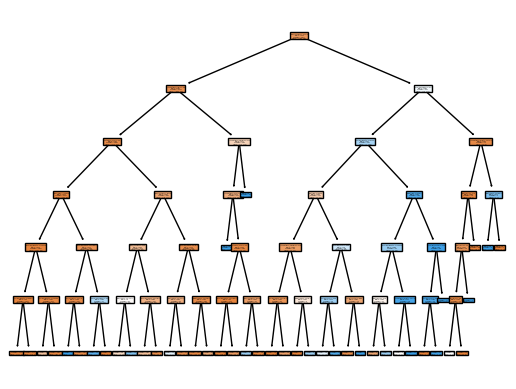

In [86]:
tree.plot_tree(DT, feature_names=X.columns, filled=True)
plt.show()

In [87]:
from sklearn.ensemble import BaggingClassifier
bag = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=6),
                        n_estimators=100,
                        max_samples=0.6,
                        max_features=.9, random_state=42)
bag.fit(X_train,Y_train)
Y_pred_train = bag.predict(X_train)
Y_pred_test = bag.predict(X_test)

In [88]:
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_pred_test).round(2))


Training Accuracy : 0.94
Testing Accuracy: 0.92


In [89]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3005
           1       0.97      0.57      0.72       495

    accuracy                           0.94      3500
   macro avg       0.95      0.78      0.84      3500
weighted avg       0.94      0.94      0.93      3500



# Random forest classifier

In [90]:
from sklearn.ensemble import RandomForestClassifier
RFC = RandomForestClassifier(n_estimators=100,max_depth=6,
                        max_samples=0.6,
                        max_features=0.9, random_state=42)

RFC.fit(X_train,Y_train)
Y_pred_train = RFC.predict(X_train)
Y_pred_test = RFC.predict(X_test)

In [91]:
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_pred_test).round(2))

Training Accuracy : 0.94
Testing Accuracy: 0.92


In [92]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      3005
           1       0.97      0.58      0.73       495

    accuracy                           0.94      3500
   macro avg       0.95      0.79      0.85      3500
weighted avg       0.94      0.94      0.93      3500



# ADA Boost Classifier

In [93]:
from sklearn.ensemble import AdaBoostClassifier
ABR = AdaBoostClassifier(n_estimators=100,learning_rate=0.1)

ABR.fit(X_train,Y_train)
Y_Pred_train = ABR.predict(X_train)
Y_Pred_test =  ABR.predict(X_test)

In [94]:
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_pred_test).round(2))


Training Accuracy : 0.94
Testing Accuracy: 0.92


In [95]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      3005
           1       0.97      0.58      0.73       495

    accuracy                           0.94      3500
   macro avg       0.95      0.79      0.85      3500
weighted avg       0.94      0.94      0.93      3500



# XGB Classifier

In [96]:
from xgboost import XGBClassifier
XGB = XGBClassifier(gamma=10,reg_lambda=4,n_estimators=100,learning_rate=0.1)

XGB.fit(X_train,Y_train)
Y_Pred_train = XGB.predict(X_train)
Y_Pred_test =  XGB.predict(X_test)

In [97]:
from sklearn import metrics
print("Training Accuracy :",metrics.accuracy_score(Y_train, Y_pred_train).round(2))
print("Testing Accuracy:",metrics.accuracy_score(Y_test, Y_pred_test).round(2))

Training Accuracy : 0.94
Testing Accuracy: 0.92


In [98]:
print('Classification report: ')
print('{}'.format(classification_report(Y_train, Y_pred_train)))

Classification report: 
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      3005
           1       0.97      0.58      0.73       495

    accuracy                           0.94      3500
   macro avg       0.95      0.79      0.85      3500
weighted avg       0.94      0.94      0.93      3500



In [100]:
import joblib
joblib.dump(logreg, 'LogisticRegression.pkl')

['LogisticRegression.pkl']